In [ ]:
!pip install -qU diffusers transformers accelerate scipy safetensors

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 88.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.4/336.4 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 92.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.14.1 which is incompatible.


# Hugging Face Implementation

In [ ]:
import requests
from PIL import Image
from io import BytesIO
from diffusers import StableDiffusionUpscalePipeline
import torch

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
# load model and scheduler
model_id = "stabilityai/stable-diffusion-x4-upscaler"
pipeline = StableDiffusionUpscalePipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

low_res_scheduler/scheduler_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/634 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/825 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/348 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/982 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/221M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
def get_low_res_img(url, shape):
    response = requests.get(url)
    low_res_img = Image.open(BytesIO(response.content)).convert("RGB")
    low_res_img = low_res_img.resize(shape)
    return low_res_img

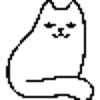

In [ ]:
url = "https://github.com/benz3927/Probability-Seminar/blob/main/cat.png?raw=true"
shape = (100, 100)
low_res_img = get_low_res_img(url, shape)

low_res_img

  0%|          | 0/75 [00:00<?, ?it/s]

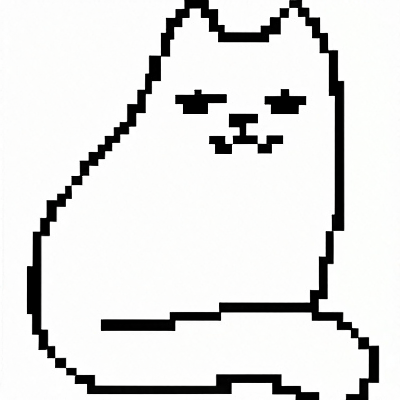

In [ ]:
prompt = "a pixel cat"
upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image

  0%|          | 0/75 [00:00<?, ?it/s]

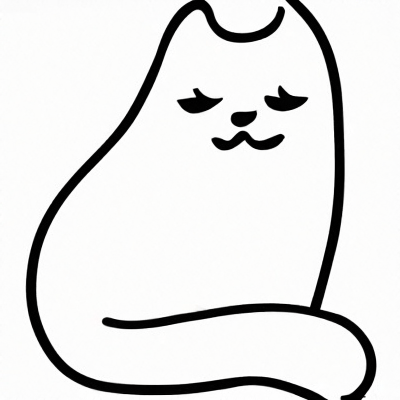

In [ ]:
prompt = "realistic happy cat"
upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image

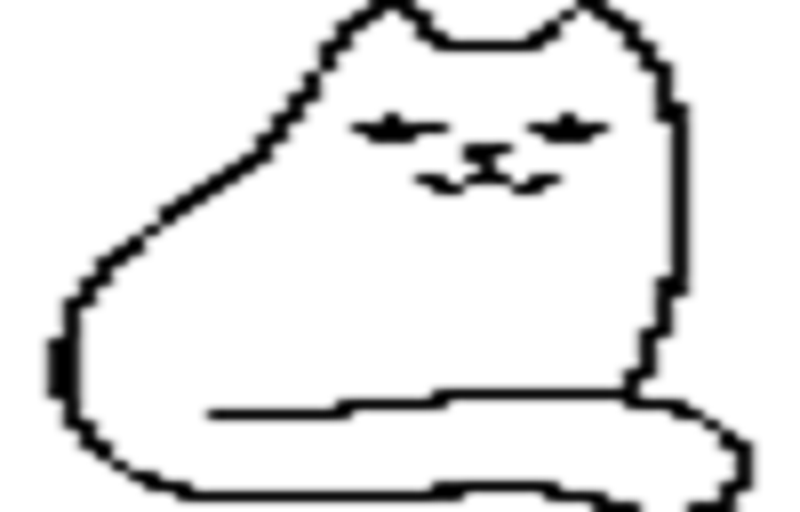

In [ ]:
upscaled_interpolation = low_res_img.resize((800, 512))
upscaled_interpolation

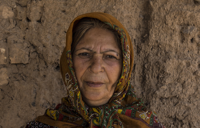

In [ ]:
url = "https://cdn.pixabay.com/photo/2022/06/14/20/57/woman-7262808_1280.jpg"
shape = (200, 128)
low_res_img = get_low_res_img(url, shape)

low_res_img

  0%|          | 0/75 [00:00<?, ?it/s]

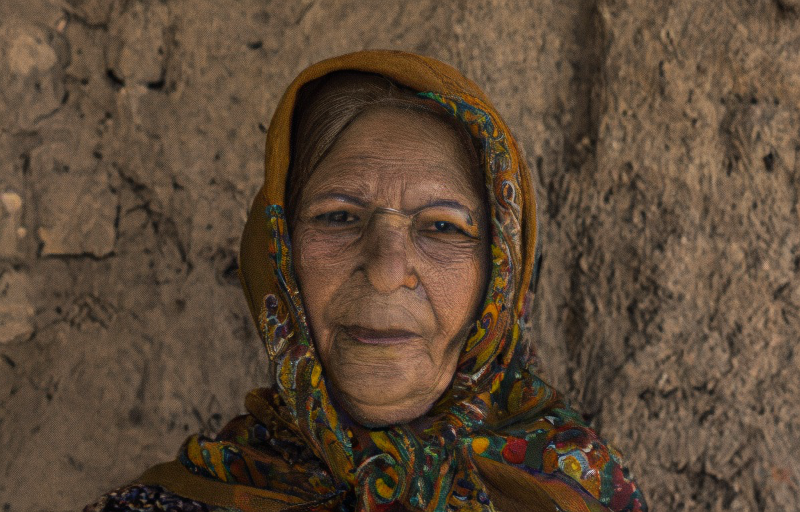

In [ ]:
prompt = "an old lady"
upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image

  0%|          | 0/75 [00:00<?, ?it/s]

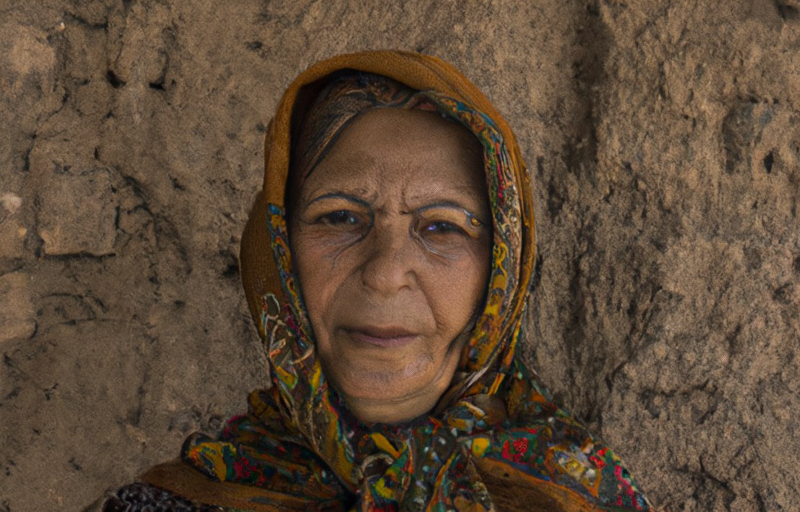

In [ ]:
prompt = "an iranian old lady with black hair, brown scarf, rock background"
upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image

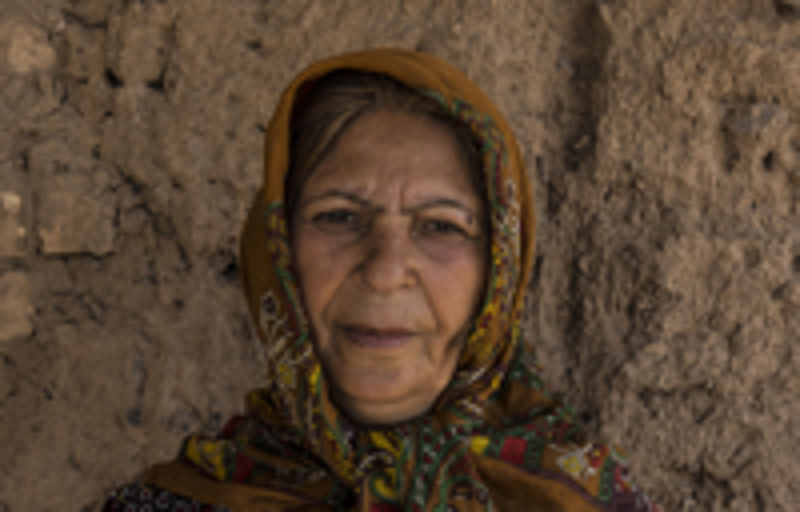

In [ ]:
upscaled_interpolation = low_res_img.resize((800, 512))
upscaled_interpolation

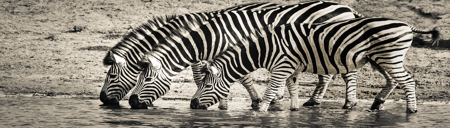

In [ ]:
url = "https://cdn.pixabay.com/photo/2017/12/28/07/44/zebra-3044577_1280.jpg"
shape = (450, 128)
low_res_img = get_low_res_img(url, shape)

low_res_img

  0%|          | 0/75 [00:00<?, ?it/s]

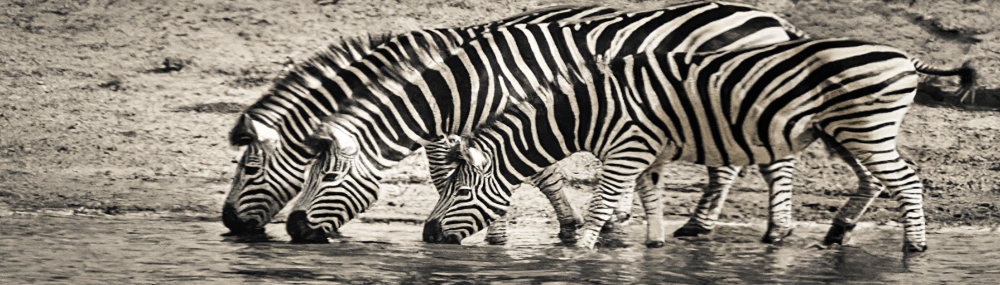

In [ ]:
prompt = "zebras drinking water"
upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image

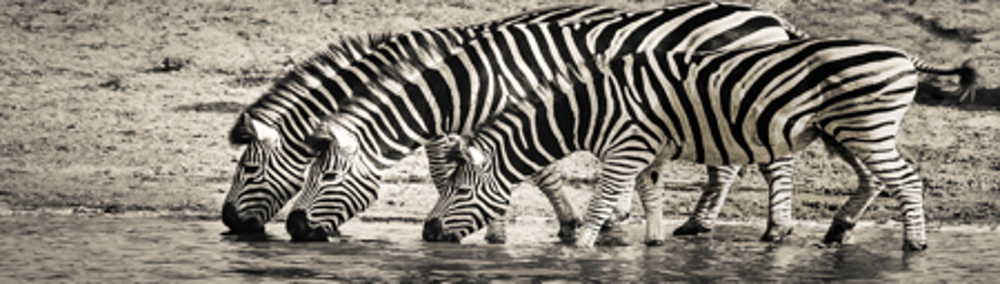

In [ ]:
upscaled_interpolation = low_res_img.resize((1800, 512))
upscaled_interpolation

# Custom


In [ ]:
from tqdm import tqdm
from torch import autocast

In [ ]:
class CustomSDUpscalingPipeline:
    """custom implementation of the Stable Diffusion Upscaling Pipeline"""

    def __init__(self,
                 vae,
                 tokenizer,
                 text_encoder,
                 unet,
                 low_res_scheduler,
                 scheduler,
                 image_processor):

        self.vae = vae
        self.tokenizer = tokenizer
        self.text_encoder = text_encoder
        self.unet = unet
        self.low_res_scheduler = low_res_scheduler
        self.scheduler = scheduler
        self.image_processor = image_processor
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'



    def get_text_embeds(self, text):
        """returns embeddings for the given `text`"""

        # tokenize the text
        text_input = self.tokenizer(text,
                                    padding='max_length',
                                    max_length=tokenizer.model_max_length,
                                    truncation=True,
                                    return_tensors='pt')
        # embed the text
        with torch.no_grad():
            text_embeds = self.text_encoder(text_input.input_ids.to(self.device))[0]
        return text_embeds



    def get_prompt_embeds(self, prompt):
        """returns prompt embeddings based on classifier free guidance"""

        if isinstance(prompt, str):
            prompt = [prompt]
        # get conditional prompt embeddings
        cond_embeds = self.get_text_embeds(prompt)
        # get unconditional prompt embeddings
        uncond_embeds = self.get_text_embeds([''] * len(prompt))
        # concatenate the above 2 embeds for classfier free guidance
        prompt_embeds = torch.cat([uncond_embeds, cond_embeds])
        return prompt_embeds


    def transform_image(self, image):
        """convert image from pytorch tensor to PIL format"""

        image = self.image_processor.postprocess(image, output_type='pil')
        return image



    def get_initial_latents(self, height, width, num_channels_latents, batch_size):
        """returns noise latent tensor of relevant shape scaled by the scheduler"""

        image_latents = torch.randn((batch_size, num_channels_latents, height, width)).to(self.device)
        # scale the initial noise by the standard deviation required by the scheduler
        image_latents = image_latents * self.scheduler.init_noise_sigma
        return image_latents



    def denoise_latents(self,
                        prompt_embeds,
                        image,
                        timesteps,
                        latents,
                        noise_level,
                        guidance_scale):
        """denoises latents from noisy latent to a meaningful latents"""

        # use autocast for automatic mixed precision (AMP) inference
        with autocast('cuda'):
            for i, t in tqdm(enumerate(timesteps)):
                # duplicate image latents to do classifier free guidance
                latent_model_input = torch.cat([latents] * 2)
                latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)
                latent_model_input = torch.cat([latent_model_input, image], dim=1)

                # predict noise residuals
                with torch.no_grad():
                    noise_pred = self.unet(
                        latent_model_input,
                        t,
                        encoder_hidden_states=prompt_embeds,
                        class_labels=noise_level
                    )['sample']

                # separate predictions for unconditional and conditional outputs
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)

                # perform guidance
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # remove the noise from the current sample i.e. go from x_t to x_{t-1}
                latents = self.scheduler.step(noise_pred, t, latents)['prev_sample']

        return latents



    def __call__(self,
                 prompt,
                 image,
                 num_inference_steps=20,
                 guidance_scale=9.0,
                 noise_level=20):
        """generates new image based on the `prompt` and the `image`"""

        # encode input prompt
        prompt_embeds = self.get_prompt_embeds(prompt)

        # preprocess image
        image = self.image_processor.preprocess(image).to(self.device)

        # prepare timesteps
        self.scheduler.set_timesteps(num_inference_steps, device=self.device)
        timesteps = self.scheduler.timesteps

        # add noise to image
        noise_level = torch.tensor([noise_level], device=self.device)
        noise = torch.randn(image.shape, device=self.device)
        image = self.low_res_scheduler.add_noise(image, noise, noise_level)

        # duplicate image for classifier free guidance
        image = torch.cat([image] * 2)
        noise_level = torch.cat([noise_level] * image.shape[0])

        # prepare the initial image in the latent space (noise on which we will do reverse diffusion)
        num_channels_latents = self.vae.config.latent_channels
        batch_size = prompt_embeds.shape[0] // 2
        height, width = image.shape[2:]
        latents = self.get_initial_latents(height, width, num_channels_latents, batch_size)

        # denoise latents
        latents = self.denoise_latents(prompt_embeds,
                                       image,
                                       timesteps,
                                       latents,
                                       noise_level,
                                       guidance_scale)

        # decode latents to get the image into pixel space
        latents = latents.to(torch.float16)
        image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False)[0]

        # convert to PIL Image format
        image = self.transform_image(image.detach()) # detach to remove any computed gradients

        return image

In [ ]:
# get all the components from the SD Upscaler pipeline
vae = pipeline.vae
tokenizer = pipeline.tokenizer
text_encoder = pipeline.text_encoder
unet = pipeline.unet
low_res_scheduler = pipeline.low_res_scheduler
scheduler = pipeline.scheduler
image_processor = pipeline.image_processor

custom_pipe = CustomSDUpscalingPipeline(vae, tokenizer, text_encoder, unet, low_res_scheduler, scheduler, image_processor)

In [ ]:
url = "https://cdn.pixabay.com/photo/2017/02/07/16/47/kingfisher-2046453_640.jpg"
shape = (200, 128)
low_res_img = get_low_res_img(url, shape)

low_res_img

20it [00:06,  3.18it/s]


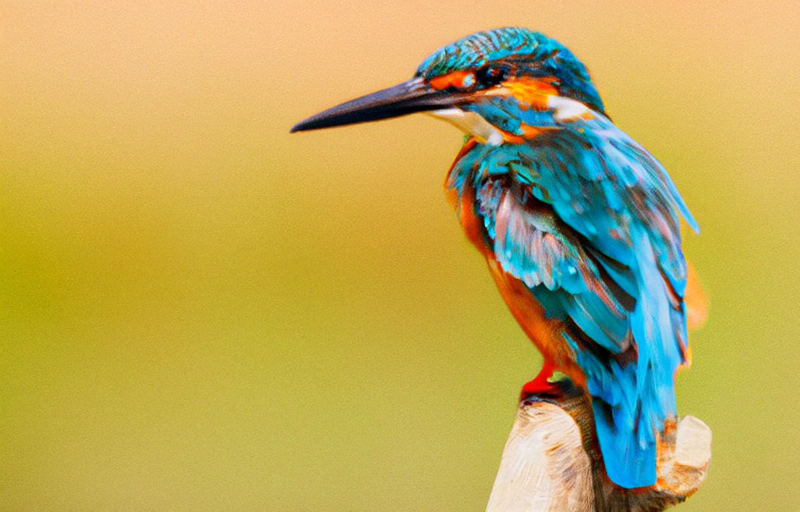

In [ ]:
prompt = "an aesthetic kingfisher"
upscaled_image = custom_pipe(prompt=prompt, image=low_res_img)[0]
upscaled_image

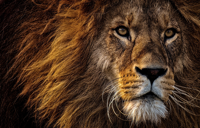

In [ ]:
url = "https://cdn.pixabay.com/photo/2018/07/31/22/08/lion-3576045_1280.jpg"
shape = (200, 128)
low_res_img = get_low_res_img(url, shape)

low_res_img

20it [00:06,  3.16it/s]


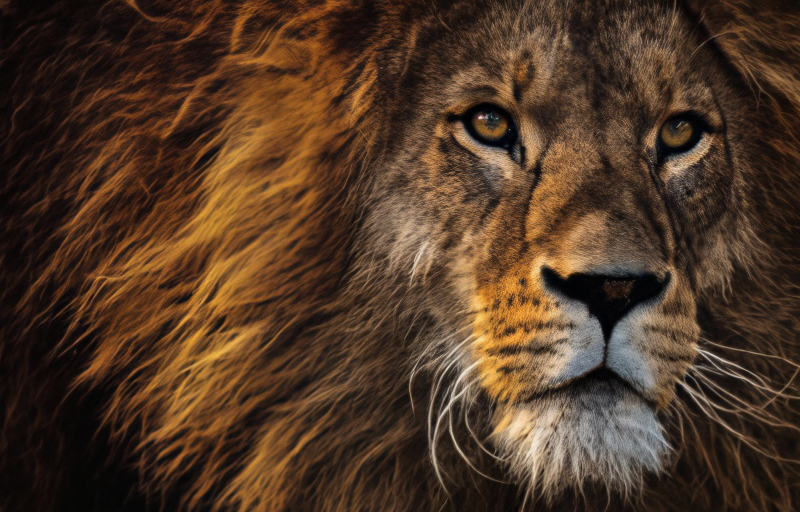

In [ ]:
prompt = "a professional photograph of a lion's face"
upscaled_image = custom_pipe(prompt=prompt, image=low_res_img)[0]
upscaled_image

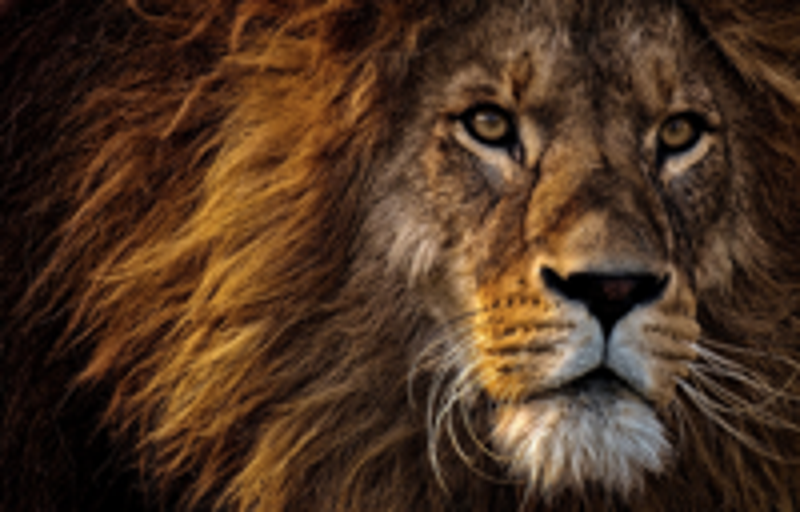

In [ ]:
upscaled_interpolation = low_res_img.resize((800, 512))
upscaled_interpolation